In [1]:
import sys, os
from collections import defaultdict
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina', 'png')
import seaborn as sns
sns.set_style('white')

import geneinfo as gi
gi.email('kaspermunch@birc.au.dk')


# # for use on the cluster
# %env ftp_proxy http://proxyserv:3128
# %env http_proxy http://proxyserv:3128
# %env https_proxy http://proxyserv:3128

class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)

In [ ]:
%%html
<style> table { font-variant-numeric: tabular-nums; } </style>

# Get info on genes

Using gene symbol:

In [5]:
gi.gene_info('USP4')

**Symbol:** **_USP4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** UNP, Unph  
*ubiquitin specific peptidase 4*  
**Summary:** The protein encoded by this gene is a protease that deubiquitinates target proteins such as ADORA2A and TRIM21. The encoded protein shuttles between the nucleus and cytoplasm and is involved in maintaining operational fidelity in the endoplasmic reticulum. Three transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Oct 2011].  
**Genomic position:** 3:49277144-49340712 (hg38), 3:49315264-49378145 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=USP4)  


 ----

Using ID:

In [6]:
gi.gene_info(7157)

**Symbol:** **_TP53_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** BCC7, BMFS5, LFS1, P53, TRP53  
*tumor protein p53*  
**Summary:** This gene encodes a tumor suppressor protein containing transcriptional activation, DNA binding, and oligomerization domains. The encoded protein responds to diverse cellular stresses to regulate expression of target genes, thereby inducing cell cycle arrest, apoptosis, senescence, DNA repair, or changes in metabolism. Mutations in this gene are associated with a variety of human cancers, including hereditary cancers such as Li-Fraumeni syndrome. Alternative splicing of this gene and the use of alternate promoters result in multiple transcript variants and isoforms. Additional isoforms have also been shown to result from the use of alternate translation initiation codons from identical transcript variants (PMIDs: 12032546, 20937277). [provided by RefSeq, Dec 2016].  
**Genomic position:** 17:7661779-7687538 (hg38), 17:7565097-7590856 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TP53)  


 ----

For a a list of genes:

In [7]:
gi.gene_info(['LARS2', 'XCR1'])

**Symbol:** **_LARS2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HLASA, LEURS, PRLTS4, mtLeuRS  
*leucyl-tRNA synthetase 2, mitochondrial*  
**Summary:** This gene encodes a class 1 aminoacyl-tRNA synthetase, mitochondrial leucyl-tRNA synthetase. Each of the twenty aminoacyl-tRNA synthetases catalyzes the aminoacylation of a specific tRNA or tRNA isoaccepting family with the cognate amino acid. [provided by RefSeq, Jul 2008].  
**Genomic position:** 3:45388561-45554726 (hg38), 3:45429998-45590913 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=LARS2)  


 ----

**Symbol:** **_XCR1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CCXCR1, GPR5  
*X-C motif chemokine receptor 1*  
**Summary:** The protein encoded by this gene is a chemokine receptor belonging to the G protein-coupled receptor superfamily. The family members are characterized by the presence of 7 transmembrane domains and numerous conserved amino acids. This receptor is most closely related to RBS11 and the MIP1-alpha/RANTES receptor. It transduces a signal by increasing the intracellular calcium ions level. The viral macrophage inflammatory protein-II is an antagonist of this receptor and blocks signaling. Several alternatively spliced transcript variants encoding the same protein have been found for this gene. [provided by RefSeq, Apr 2020].  
**Genomic position:** 3:46016990-46085825 (hg38), 3:46058516-46069234 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=XCR1)  


 ----

For species other than human:

In [8]:
gi.gene_info('DYNLT3', species='mouse', scopes=['mgi'])

**Symbol:** **_Dynlt3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 2310075M16Rik, AU042796, Tcte1l  
*dynein light chain Tctex-type 3*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=Dynlt3)  


 ----

In [9]:
gi.gene_info(67117, species='mouse', scopes=['mgi'])

**Symbol:** **_Dynlt3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 2310075M16Rik, AU042796, Tcte1l  
*dynein light chain Tctex-type 3*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=Dynlt3)  


 ----

## Get the HGCN symbol for an alias

In [3]:
gi.hgcn_symbol(['CXorf23', 'BCLAF3'])

['BCLAF3', 'BCLAF3']

# Get genes in a region

In [ ]:
gi.get_genes_region('chrX', 76500000, 77500000)

[('FGF16',
  77447389,
  77457278,
  1,
  [(77447389, 77447948), (77454157, 77454260), (77456277, 77457278)],
  'protein_coding')]

In [ ]:
# for gene in mg.query('q=chr2:49500000-50000000 AND type_of_gene:protein-coding', species='human', fetch_all=True):
#     geneinfo(gene['symbol'])

# Plot data over gene annotation

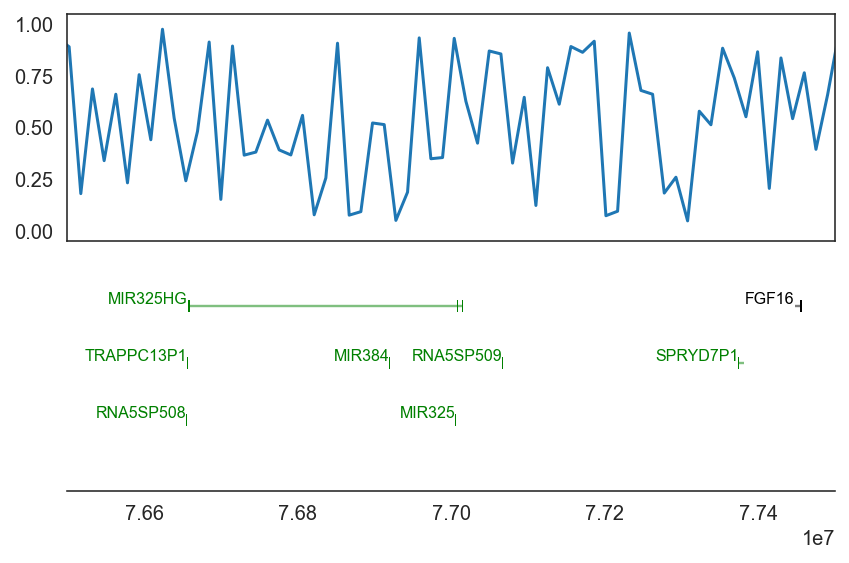

In [ ]:
data = np.linspace(1, 1520300000, 100000), np.random.random(100000)

ax = gi.gene_plot('chrX', 76500000, 77500000)
ax.plot(*data)
plt.tight_layout()

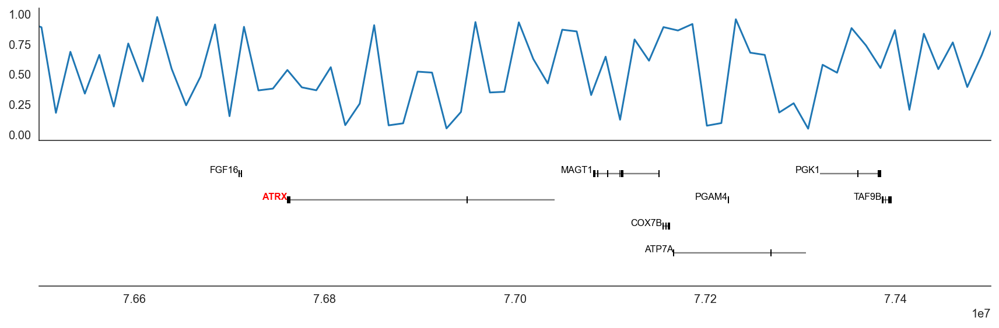

In [ ]:
ax = gi.gene_plot('chrX', 76500000, 77500000, 
                  figsize=(12, 4),          # larger figure
                  highlight=['ATRX'],       # highlight some genes in red
                  hg19=True,                # hg19 coordinates
                  only_protein_coding=True, # only protein coding genes
                  exact_exons=False,        # allow exons to be wide enough to be visible on large plots
                  hard_limits=True          # truncate genes that overlap the borders of the specified range
                 )

ax.plot(*data)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

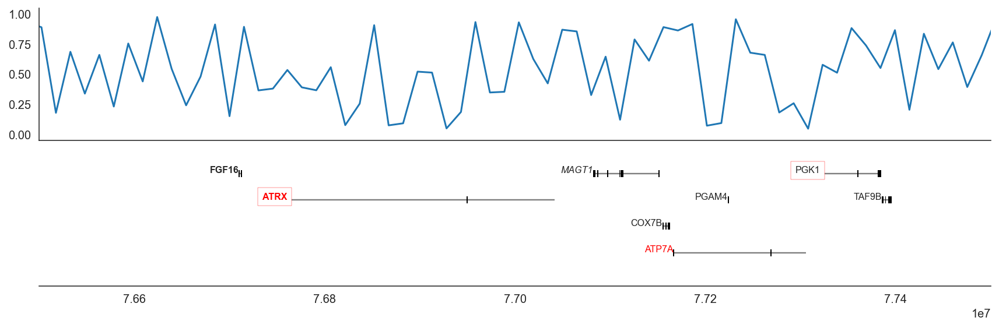

In [ ]:
highlight = defaultdict(dict)
for gene in ['ATRX', 'FGF16']:
    highlight[gene].update(dict(weight='bold'))
for gene in ['MAGT1']:
    highlight[gene].update(dict(style='italic'))
for gene in ['ATP7A', 'ATRX']:
    highlight[gene].update(dict(color='red'))
for gene in ['PGK1', 'ATRX']:
    highlight[gene].update(dict(bbox={'edgecolor':'red','facecolor':'white', 'linewidth':0.2}))
    # highlight[gene].update(dict(weight='bold', bbox={'facecolor': 'grey', 'alpha': 0.3, 'pad': 1}))
    
ax = gi.gene_plot('chrX', 76500000, 77500000, 
                  figsize=(12, 4),          # larger figure
                  highlight=highlight,       # highlight some genes in red
                  hg19=True,                # hg19 coordinates
                  only_protein_coding=True, # only protein coding genes
                  exact_exons=False,        # allow exons to be wide enough to be visible on large plots
                  hard_limits=True          # truncate genes that overlap the borders of the specified range
                 )

ax.plot(*data)
sns.despine(ax=ax) # make it look nicer
plt.tight_layout()

In [ ]:
gi.gene_info(['HYAL3', 'IFRD2'])

**Symbol:** **_HYAL3_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HYAL-3, LUCA-3, LUCA3  
*hyaluronidase 3*  
**Summary:** This gene encodes a member of the hyaluronidase family. Hyaluronidases are endoglycosidase enzymes that degrade hyaluronan, one of the major glycosaminoglycans of the extracellular matrix. The regulated turnover of hyaluronan plays a critical role in many biological processes including cell proliferation, migration and differentiation. The encoded protein may also play an important role in sperm function. This gene is one of several related genes in a region of chromosome 3p21.3 associated with tumor suppression, and the expression of specific transcript variants may be indicative of tumor status. Alternatively spliced transcript variants encoding multiple isoforms have been observed for this gene, and some isoforms may lack hyaluronidase activity. This gene overlaps and is on the same strand as N-acetyltransferase 6 (GCN5-related), and some transcripts of each gene share a portion of the first exon. [provided by RefSeq, Jan 2011].  
**Genomic position:** 3:50292831-50299405 (hg38), 3:50330262-50336899, HG325_PATCH:50330263-50336900 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HYAL3)  


 ----

**Symbol:** **_IFRD2_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** IFNRP, SKMc15, SM15  
*interferon related developmental regulator 2*  
**Genomic position:** 3:50287732-50292918 (hg38), 3:50325163-50330349, HG325_PATCH:50325164-50330027, HG325_PATCH:50325175-50330350 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IFRD2)  


 ----

In [ ]:
gi.gene_info_region('chrX', 76500000, 77500000, only_protein_coding=True, hg19=True)

**Symbol:** **_FGF16_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** FGF-16, MF4  
*fibroblast growth factor 16*  
**Summary:** This gene encodes a member of a family of proteins that are involved in a variety of biological processes, including embryonic development, cell growth, morphogenesis, tissue repair, tumor growth and invasion. This gene is expressed in cardiac cells and is required for proper heart development. Mutation in this gene was also observed in individuals with metacarpal 4-5 fusion. [provided by RefSeq, Mar 2014].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FGF16)  


 ----

**Symbol:** **_ATRX_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** JMS, MRX52, RAD54, RAD54L, XH2, XNP, ZNF-HX  
*ATRX chromatin remodeler*  
**Summary:** The protein encoded by this gene contains an ATPase/helicase domain, and thus it belongs to the SWI/SNF family of chromatin remodeling proteins. This protein is found to undergo cell cycle-dependent phosphorylation, which regulates its nuclear matrix and chromatin association, and suggests its involvement in the gene regulation at interphase and chromosomal segregation in mitosis. Mutations in this gene are associated with X-linked syndromes exhibiting cognitive disabilities as well as alpha-thalassemia (ATRX) syndrome. These mutations have been shown to cause diverse changes in the pattern of DNA methylation, which may provide a link between chromatin remodeling, DNA methylation, and gene expression in developmental processes. Multiple alternatively spliced transcript variants encoding distinct isoforms have been reported. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77504880-77786233 (hg38), HG1426_PATCH:76765832-77047170, X:76760356-77041702 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATRX)  


 ----

**Symbol:** **_MAGT1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CDG1CC, IAP, MRX95, OST3B, PRO0756, SLC58A1, XMEN, bA217H1.1  
*magnesium transporter 1*  
**Summary:** This gene encodes a ubiquitously expressed magnesium cation transporter protein that localizes to the cell membrane. This protein also associates with N-oligosaccharyl transferase and therefore may have a role in N-glycosylation. Mutations in this gene cause a form of X-linked intellectual disability (XLID). This gene may have multiple in-frame translation initiation sites, one of which would encode a shorter protein with an N-terminus containing a signal peptide at amino acids 1-29. [provided by RefSeq, Jul 2017].  
**Genomic position:** X:77825747-77899271 (hg38), HG1426_PATCH:77087318-77156547, X:77081861-77151090 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MAGT1)  


 ----

**Symbol:** **_COX7B_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** APLCC, LSDMCA2  
*cytochrome c oxidase subunit 7B*  
**Summary:** Cytochrome c oxidase (COX), the terminal component of the mitochondrial respiratory chain, catalyzes the electron transfer from reduced cytochrome c to oxygen. This component is a heteromeric complex consisting of 3 catalytic subunits encoded by mitochondrial genes and multiple structural subunits encoded by nuclear genes. The mitochondrially-encoded subunits function in electron transfer, and the nuclear-encoded subunits may function in the regulation and assembly of the complex. This nuclear gene encodes subunit VIIb, which is highly similar to bovine COX VIIb protein and is found in all tissues. This gene may have several pseudogenes on chromosomes 1, 2, 20 and 22. [provided by RefSeq, Jun 2011].  
**Genomic position:** X:77899440-77907376 (hg38), HG1426_PATCH:77160392-77168327, X:77154935-77162870 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=COX7B)  


 ----

**Symbol:** **_ATP7A_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DSMAX, MK, MNK, SMAX3  
*ATPase copper transporting alpha*  
**Summary:** This gene encodes a transmembrane protein that functions in copper transport across membranes. This protein is localized to the trans Golgi network, where it is predicted to supply copper to copper-dependent enzymes in the secretory pathway. It relocalizes to the plasma membrane under conditions of elevated extracellular copper, and functions in the efflux of copper from cells. Mutations in this gene are associated with Menkes disease, X-linked distal spinal muscular atrophy, and occipital horn syndrome. Alternatively-spliced transcript variants have been observed. [provided by RefSeq, Aug 2013].  
**Genomic position:** X:77910690-78050395 (hg38), HG1426_PATCH:77171651-77311349, X:77166194-77305892 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=ATP7A)  


 ----

**Symbol:** **_PGAM4_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** PGAM-B, PGAM1, PGAM3, dJ1000K24.1  
*phosphoglycerate mutase family member 4*  
**Summary:** This intronless gene appears to have arisen from a retrotransposition event, yet it is thought to be an expressed, protein-coding gene. The encoded protein is a member of the phosphoglycerate mutase family, a set of enzymes that catalyze the transfer of a phosphate group from 3-phosphoglycerate to 2-phosphoglycerate. [provided by RefSeq, May 2010].  
**Genomic position:** X:77967949-77969638 (hg38), HG1426_PATCH:77228915-77230592, X:77223458-77225135 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PGAM4)  


 ----

**Symbol:** **_PGK1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** HEL-S-68p, MIG10, PGKA  
*phosphoglycerate kinase 1*  
**Summary:** The protein encoded by this gene is a glycolytic enzyme that catalyzes the conversion of 1,3-diphosphoglycerate to 3-phosphoglycerate. The encoded protein may also act as a cofactor for polymerase alpha. Additionally, this protein is secreted by tumor cells where it participates in angiogenesis by functioning to reduce disulfide bonds in the serine protease, plasmin, which consequently leads to the release of the tumor blood vessel inhibitor angiostatin. The encoded protein has been identified as a moonlighting protein based on its ability to perform mechanistically distinct functions. Deficiency of the enzyme is associated with a wide range of clinical phenotypes hemolytic anemia and neurological impairment. Pseudogenes of this gene have been defined on chromosomes 19, 21 and the X chromosome. [provided by RefSeq, Jan 2014].  
**Genomic position:** X:77910739-78129295 (hg38), HG1426_PATCH:77326142-77390250, X:77320685-77384793 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=PGK1)  


 ----

**Symbol:** **_TAF9B_**   
*TATA-box binding protein associated factor 9b*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TAF9B)  


 ----

In [ ]:
gi.gene_info_region('chrX', 76500000, 77500000, only_protein_coding=False)

**Symbol:** **_MIR325HG_** (ncRNA) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MIR384HG  
*MIR325 host gene*  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MIR325HG)  


 ----

**Symbol:** **_TRAPPC13P1_**   
*trafficking protein particle complex 13 pseudogene 1*  
**Genomic position:** X:76655498-76656559 (hg38), X:75875899-75876960 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=TRAPPC13P1)  


 ----

**Symbol:** **_MIR384_** (ncRNA) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MIRN384, hsa-mir-384  
*microRNA 384*  
**Summary:** microRNAs (miRNAs) are short (20-24 nt) non-coding RNAs that are involved in post-transcriptional regulation of gene expression in multicellular organisms by affecting both the stability and translation of mRNAs. miRNAs are transcribed by RNA polymerase II as part of capped and polyadenylated primary transcripts (pri-miRNAs) that can be either protein-coding or non-coding. The primary transcript is cleaved by the Drosha ribonuclease III enzyme to produce an approximately 70-nt stem-loop precursor miRNA (pre-miRNA), which is further cleaved by the cytoplasmic Dicer ribonuclease to generate the mature miRNA and antisense miRNA star (miRNA*) products. The mature miRNA is incorporated into a RNA-induced silencing complex (RISC), which recognizes target mRNAs through imperfect base pairing with the miRNA and most commonly results in translational inhibition or destabilization of the target mRNA. The RefSeq represents the predicted microRNA stem-loop. [provided by RefSeq, Sep 2009].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MIR384)  


 ----

**Symbol:** **_RNA5SP508_**   
*RNA, 5S ribosomal pseudogene 508*  
**Genomic position:** X:76655009-76655127 (hg38), X:75875410-75875528 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RNA5SP508)  


 ----

**Symbol:** **_FGF16_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** FGF-16, MF4  
*fibroblast growth factor 16*  
**Summary:** This gene encodes a member of a family of proteins that are involved in a variety of biological processes, including embryonic development, cell growth, morphogenesis, tissue repair, tumor growth and invasion. This gene is expressed in cardiac cells and is required for proper heart development. Mutation in this gene was also observed in individuals with metacarpal 4-5 fusion. [provided by RefSeq, Mar 2014].  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=FGF16)  


 ----

**Symbol:** **_SPRYD7P1_**   
*SPRY domain containing 7 pseudogene 1*  
**Genomic position:** X:77374212-77381319 (hg38), X:76594675-76601782 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SPRYD7P1)  


 ----

**Symbol:** **_RNA5SP509_**   
*RNA, 5S ribosomal pseudogene 509*  
**Genomic position:** X:77066709-77066827 (hg38), X:76287130-76287248 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RNA5SP509)  


 ----

**Symbol:** **_MIR325_** (ncRNA) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** MIRN325, hsa-mir-325  
*microRNA 325*  
**Summary:** microRNAs (miRNAs) are short (20-24 nt) non-coding RNAs that are involved in post-transcriptional regulation of gene expression in multicellular organisms by affecting both the stability and translation of mRNAs. miRNAs are transcribed by RNA polymerase II as part of capped and polyadenylated primary transcripts (pri-miRNAs) that can be either protein-coding or non-coding. The primary transcript is cleaved by the Drosha ribonuclease III enzyme to produce an approximately 70-nt stem-loop precursor miRNA (pre-miRNA), which is further cleaved by the cytoplasmic Dicer ribonuclease to generate the mature miRNA and antisense miRNA star (miRNA*) products. The mature miRNA is incorporated into a RNA-induced silencing complex (RISC), which recognizes target mRNAs through imperfect base pairing with the miRNA and most commonly results in translational inhibition or destabilization of the target mRNA. The RefSeq represents the predicted microRNA stem-loop. [provided by RefSeq, Sep 2009].  
**Genomic position:** X:77005404-77005501 (hg38), HG1425_PATCH:76225239-76225336, X:76225829-76225926 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=MIR325)  


 ----

## STRING interaction network

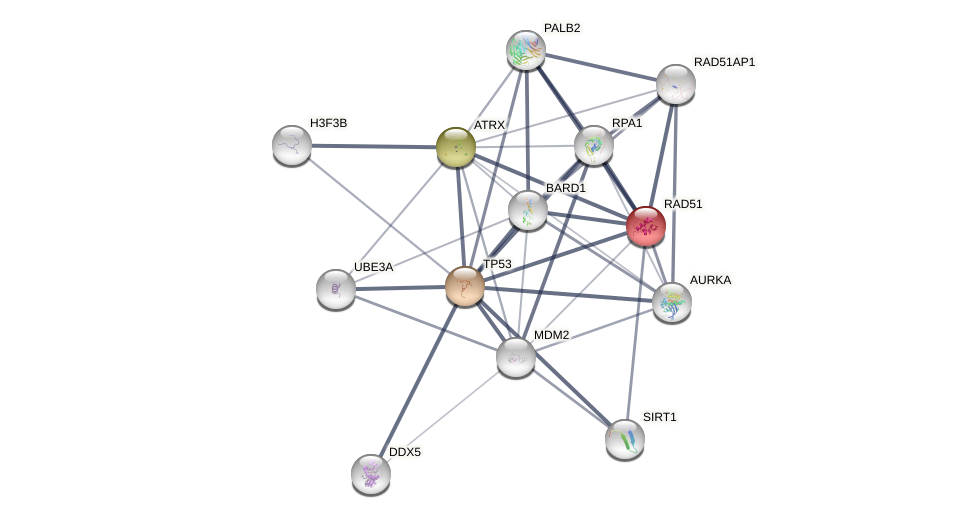

In [18]:
gi.show_string_network(['ATRX', 'TP53', 'RAD51'], nodes=10)

# Gene ontology information

Get info for one or more GO terms:

In [19]:
gi.go_info('GO:0000776')

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

In [20]:
gi.go_info(gi.get_go_terms_for_genes(['DYNLT3']))

**<span style="color:gray;">GO:0000776:</span>** **kinetochore**  
 A multisubunit complex that is located at the centromeric region of DNA and provides an attachment point for the spindle microtubules.    

 ----

**<span style="color:gray;">GO:0005515:</span>** **protein binding**  
 Binding to a protein.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0005737:</span>** **cytoplasm**  
 The contents of a cell excluding the plasma membrane and nucleus, but including other subcellular structures.    

 ----

**<span style="color:gray;">GO:0005868:</span>** **cytoplasmic dynein complex**  
 Any dynein complex with a homodimeric dynein heavy chain core that catalyzes movement along a microtubule. Cytoplasmic dynein complexes participate in many cytoplasmic transport activities in eukaryotes, such as mRNA localization, intermediate filament transport, nuclear envelope breakdown, apoptosis, transport of centrosomal proteins, mitotic spindle assembly, virus transport, kinetochore functions, and movement of signaling and spindle checkpoint proteins. Some complexes participate in intraflagellar transport. Subunits associated with the dynein heavy chain mediate association between dynein heavy chain and cargoes, and may include light chains and light intermediate chains.    

 ----

**<span style="color:gray;">GO:0007018:</span>** **microtubule-based movement**  
 A microtubule-based process that results in the movement of organelles, other microtubules, or other cellular components.  Examples include motor-driven movement along microtubules and movement driven by polymerization or depolymerization of microtubules.    

 ----

**<span style="color:gray;">GO:0007049:</span>** **cell cycle**  
 The progression of biochemical and morphological phases and events that occur in a cell during successive cell replication or nuclear replication events. Canonically, the cell cycle comprises the replication and segregation of genetic material followed by the division of the cell, but in endocycles or syncytial cells nuclear replication or nuclear division may not be followed by cell division.    

 ----

**<span style="color:gray;">GO:0007346:</span>** **regulation of mitotic cell cycle**  
 Any process that modulates the rate or extent of progress through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0042802:</span>** **identical protein binding**  
 Binding to an identical protein or proteins.    

 ----

**<span style="color:gray;">GO:0045505:</span>** **dynein intermediate chain binding**  
 Binding to an intermediate chain of the dynein complex.    

 ----

**<span style="color:gray;">GO:0045931:</span>** **positive regulation of mitotic cell cycle**  
 Any process that activates or increases the rate or extent of progression through the mitotic cell cycle.    

 ----

**<span style="color:gray;">GO:0051301:</span>** **cell division**  
 The process resulting in division and partitioning of components of a cell to form more cells; may or may not be accompanied by the physical separation of a cell into distinct, individually membrane-bounded daughter cells.    

 ----

**<span style="color:gray;">GO:0061673:</span>** **mitotic spindle astral microtubule**  
 Any of the mitotic spindle microtubules that radiate in all directions from the spindle poles and are thought to contribute to the forces that separate the poles and position them in relation to the rest of the cell.    

 ----

# Genes and GO terms

Get GO terms for a one or more genes:

In [21]:
go_terms = gi.get_go_terms_for_genes(['DYNLT3'])
go_terms[:10]

['GO:0000776',
 'GO:0005515',
 'GO:0005634',
 'GO:0005737',
 'GO:0005868',
 'GO:0007018',
 'GO:0007049',
 'GO:0007346',
 'GO:0042802',
 'GO:0045505']

Show the sub-graph defined by the GO terms:

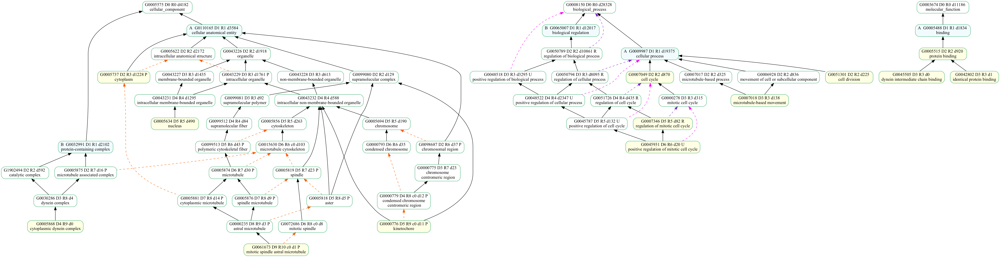

In [22]:
gi.show_go_dag_for_terms(go_terms)

Show the sub-graph defined by the GO terms for a single gene:

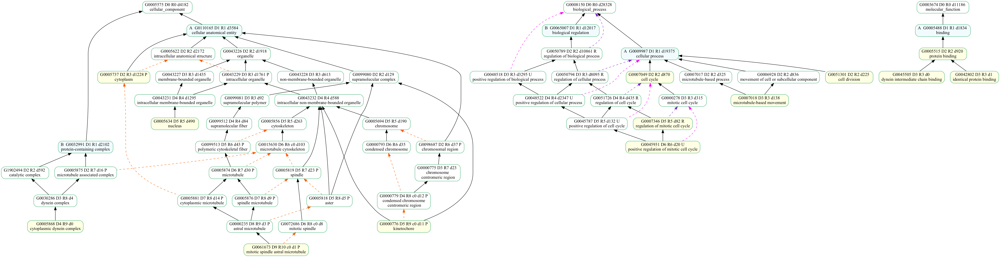

In [23]:
gi.show_go_dag_for_gene('DYNLT3')

Same but using GO annotation backed by certain kinds of evidence:

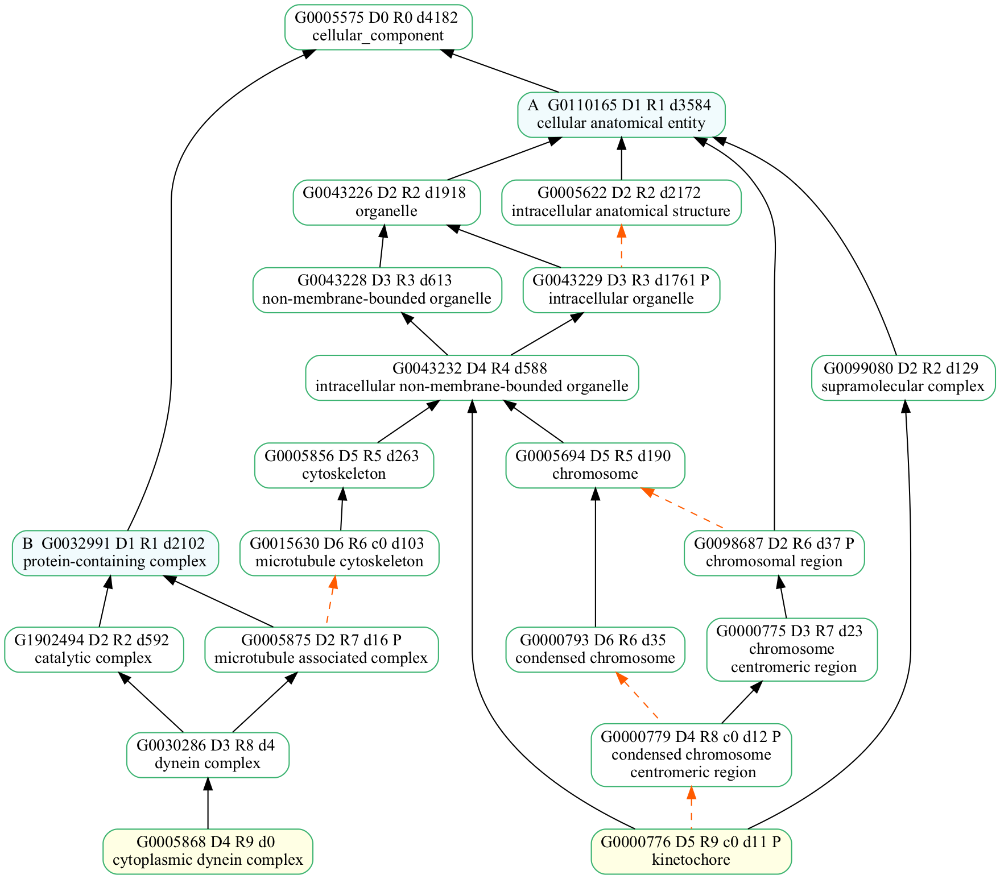

In [24]:
gi.show_go_dag_for_gene('DYNLT3', evidence=['IDA', 'EXP', 'HTP'])

Show the categories of evidence backing GO annotations:

In [25]:
gi.show_go_evidence_codes()


**Experimental evidence codes:** <br>
Inferred from Experiment (EXP) <br>
Inferred from Direct Assay (IDA) <br>
Inferred from Physical Interaction (IPI) <br>
Inferred from Mutant Phenotype (IMP) <br>
Inferred from Genetic Interaction (IGI) <br>
Inferred from Expression Pattern (IEP) <br>
Inferred from High Throughput Experiment (HTP) <br>
Inferred from High Throughput Direct Assay (HDA) <br>
Inferred from High Throughput Mutant Phenotype (HMP) <br>
Inferred from High Throughput Genetic Interaction (HGI) <br>
Inferred from High Throughput Expression Pattern (HEP) 

**Phylogenetically-inferred annotations:** <br>
Inferred from Biological aspect of Ancestor (IBA) <br>
Inferred from Biological aspect of Descendant (IBD) <br>
Inferred from Key Residues (IKR) <br>
Inferred from Rapid Divergence (IRD)

**Computational analysis evidence codes** <br>
Inferred from Sequence or structural Similarity (ISS) <br>
Inferred from Sequence Orthology (ISO) <br>
Inferred from Sequence Alignment (ISA) <br>
Inferred from Sequence Model (ISM) <br>
Inferred from Genomic Context (IGC) <br>
Inferred from Reviewed Computational Analysis (RCA)

**Author statement evidence codes:** <br>
Traceable Author Statement (TAS) <br>
Non-traceable Author Statement (NAS)

**Curator statement evidence codes:** <br>
Inferred by Curator (IC) <br>
No biological Data available (ND)

**Electronic annotation evidence code:** <br>
Inferred from Electronic Annotation (IEA)



# Find genes matching regexp in their description

In [26]:
df = gi.get_genes_for_go_regex('kinesin|dynein')
df.head() << left()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)


,symbol,name,chrom,start,end
0,SPAG1,sperm associated antigen 1,8,100158037,100241903
1,BLOC1S2,biogenesis of lysosomal organelles complex 1 subunit 2,10,100286679,100273277
2,LZTS2,leucine zipper tumor suppressor 2,10,100996587,101007832
3,DYNC1H1,dynein cytoplasmic 1 heavy chain 1,14,101964572,102056442
4,KIF1B,kinesin family member 1B,1,10210569,10381602


Same for mouse:

In [27]:
df = gi.get_genes_for_go_regex('kinesin|dynein', taxid=10090)
df.head() << left()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)
geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)


,symbol,name,chrom,start,end
0,Cep290,centrosomal protein 290,10,100323409,100411532
1,Odad4,outer dynein arm complex subunit 4,11,100436433,100463391
2,Rpgr,retinitis pigmentosa GTPase regulator,X,10083033,10024454
3,Ppp1r42,"protein phosphatase 1, regulatory subunit 42",1,10083765,10038846
4,Ccdc88c,coiled-coil domain containing 88C,12,100995609,100877777


# GO enrichment

Example study in mouse:

Study genes (foreground genes):

In [28]:
example_study = pd.read_csv("nbt.3102-S4_GeneIDs.csv", sep=';', names=['symbol', 'geneid', 'pval'])
study_genes = example_study.geneid  
study_genes[:5]

0    100033452
1        18746
2        13806
3        18301
4        56040
Name: geneid, dtype: int64

In [29]:
go_results = gi.go_enrichment(study_genes, taxid=10090)
go_results.head(10)

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005829,e,1.482352e-49,2.721598e-46,0.456693,0.143491,<GO:0005829>
1,BP,GO:0002181,e,2.212233e-46,2.794493e-42,0.097113,0.003109,<GO:0002181>
2,CC,GO:0022626,e,2.493080e-41,2.288648e-38,0.089239,0.003071,<GO:0022626>
3,CC,GO:0005737,e,2.107273e-39,1.289651e-36,0.587927,0.269543,<GO:0005737>
4,CC,GO:0005840,e,1.049279e-33,4.816189e-31,0.099738,0.006596,<GO:0005840>
5,MF,GO:0003735,e,3.730013e-34,1.667689e-30,0.097113,0.005952,<GO:0003735>
6,MF,GO:0005515,e,8.914658e-31,1.992872e-27,0.464567,0.203275,<GO:0005515>
7,BP,GO:0006412,e,5.030183e-29,3.177064e-25,0.102362,0.009288,<GO:0006412>
8,CC,GO:0043209,e,5.081765e-27,1.866024e-24,0.089239,0.007279,<GO:0043209>
9,CC,GO:0022627,e,2.009723e-23,6.149753e-21,0.049869,0.001744,<GO:0022627>


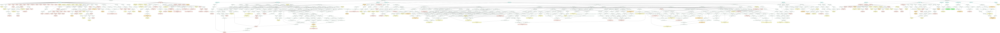

In [30]:
gi.show_go_dag_enrichment_results(go_results.obj)

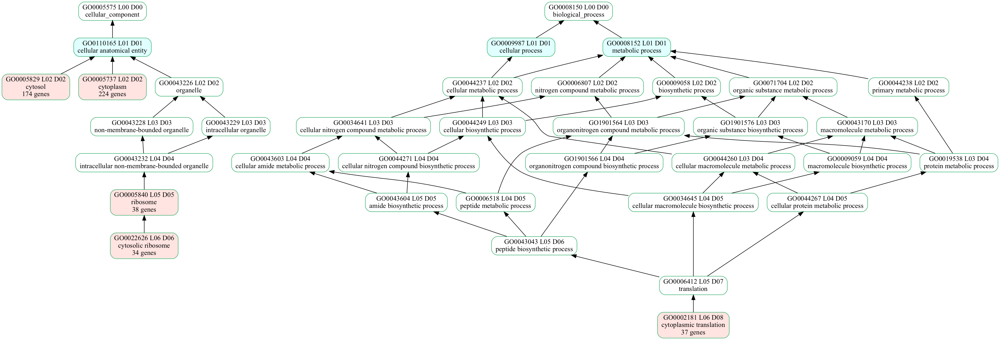

In [31]:
gi.show_go_dag_enrichment_results(go_results.obj[:5])

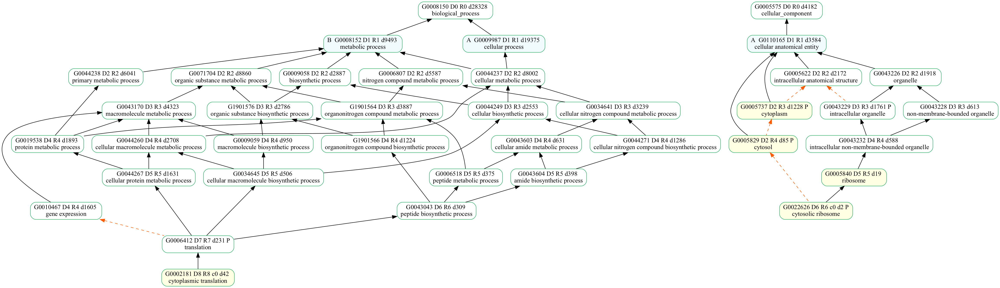

In [32]:
gi.show_go_dag_for_terms(go_results.term_id[:5])

Limit go dag to a sub graph including only specified terms and their children:

In [33]:
import geneinfo
import geneinfo as gi
import importlib
importlib.reload(geneinfo)

go_results = gi.go_enrichment(study_genes, taxid=10090, terms=['GO:0002181', 'GO:0005829'])
#go_results = gi.go_enrichment(study_genes, 'Mus musculus', terms=['GO:0002181', 'GO:0005829'])
go_results

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(def relationship)


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005829,e,1.482352e-49,4.447056e-49,0.456693,0.143491,<GO:0005829>
1,BP,GO:0002181,e,2.212233e-46,3.539573e-45,0.097113,0.003109,<GO:0002181>
2,CC,GO:0005737,e,2.107273e-39,3.160910e-39,0.587927,0.269543,<GO:0005737>
3,BP,GO:0006412,e,5.030183e-29,4.024147e-28,0.102362,0.009288,<GO:0006412>
4,CC,GO:0005622,e,2.270509e-02,2.270509e-02,0.015748,0.005724,<GO:0005622>


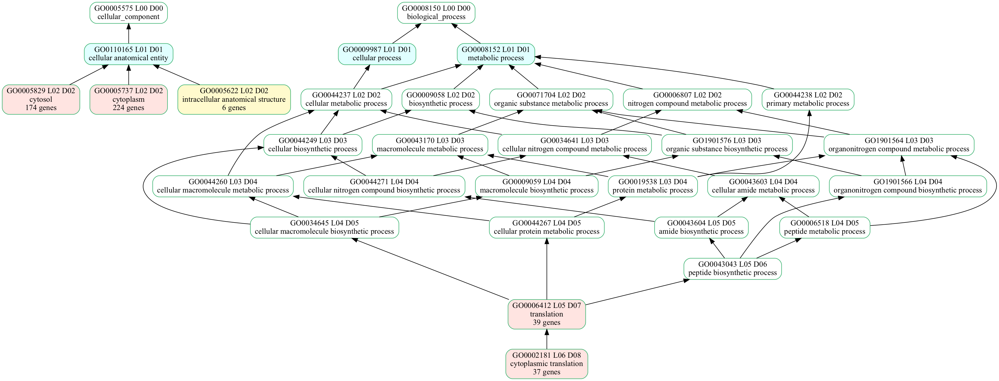

In [34]:
gi.show_go_dag_enrichment_results(go_results.obj[:5])

Specifying a custom set of background genes:

In [35]:
all_protein_coding = set(pd.read_csv('geneinfo_cache/10090_protein_genes.txt', sep='\t').Symbol)
# only the first 5000 genes:
subset_background = list(all_protein_coding)[:5000]

go_results = gi.go_enrichment(study_genes, taxid=10090, background_genes=subset_background)
go_results

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,CC,GO:0005829,e,2.950631e-12,3.431584e-09,0.515152,0.1502,<GO:0005829>
1,CC,GO:0043209,e,1.742897e-09,6.756630e-07,0.136364,0.0082,<GO:0043209>
2,CC,GO:0005737,e,1.398174e-09,6.756630e-07,0.636364,0.2772,<GO:0005737>
3,CC,GO:0015629,e,5.920173e-07,1.721290e-04,0.121212,0.0114,<GO:0015629>
4,CC,GO:0005884,e,7.860891e-07,1.828443e-04,0.090909,0.0052,<GO:0005884>
5,CC,GO:0022626,e,1.266455e-05,2.454811e-03,0.060606,0.0024,<GO:0022626>
6,CC,GO:0002102,e,1.173722e-04,1.706299e-02,0.045455,0.0016,<GO:0002102>
7,CC,GO:0045335,e,1.144764e-04,1.706299e-02,0.060606,0.0040,<GO:0045335>
8,CC,GO:0016020,e,1.508757e-04,1.949649e-02,0.469697,0.2532,<GO:0016020>
9,CC,GO:0042824,e,1.716343e-04,1.996107e-02,0.030303,0.0004,<GO:0042824>


Restricting background set of genes to those on the X chromosome:

In [36]:
go_results = gi.go_enrichment(study_genes, taxid=10090, background_chrom='X')
go_results

,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj


----

----

----

----

Get all go terms with "spindle" or "microtubul" in their names:

In [37]:
target_terms = gi.get_terms_for_go_regex('microtubul')
#target_terms = gi.get_terms_for_go_regex('spindle')

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(comment def relationship synonym xref)


In [38]:
len(target_terms)

266

In [39]:
all_protein_coding = set(pd.read_csv('geneinfo_cache/9606_protein_genes.txt', sep='\t').Symbol)

all_diff_exp_df = pd.read_csv("/Users/kmt/Google Drive/teaching/pib/tessa/diff_exp_genes/DEG_XY_spermatids_filtered_pval1_fc2.tsv", 
            sep='\t', names=['primerid', 'pval', 'coef', 'FDR'])

In [40]:
diff_exp_gene_names = [x for x in all_diff_exp_df.primerid if x in all_protein_coding]
len(diff_exp_gene_names)

133

In [41]:
go_results = gi.go_enrichment(diff_exp_gene_names[:30], terms=target_terms, background_chrom='X', list_study_genes=True)
go_results['rel_enrichment'] = go_results['ratio'] / go_results['bg_ratio']
go_results

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2022-03-22) 47,103 Terms; optional_attrs(def relationship)


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes,rel_enrichment
0,BP,GO:0060271,e,0.000038,0.003766,0.137931,0.008383,<GO:0060271>,"[OCRL, RPGR, OFD1, HDAC6]",16.453202
1,MF,GO:0043015,e,0.001166,0.017490,0.068966,0.002395,<GO:0043015>,"[DDX3X, OFD1]",28.793103
2,MF,GO:0043014,e,0.006697,0.033486,0.068966,0.004790,<GO:0043014>,"[OFD1, HDAC6]",14.396552
3,MF,GO:0048487,e,0.006697,0.033486,0.068966,0.004790,<GO:0048487>,"[EMD, HDAC6]",14.396552
4,BP,GO:0031333,e,0.001166,0.039304,0.068966,0.002395,<GO:0031333>,"[DDX3X, HDAC6]",28.793103
5,BP,GO:0006886,e,0.001203,0.039304,0.103448,0.008383,<GO:0006886>,"[RPGR, HDAC6, SYTL5]",12.339901


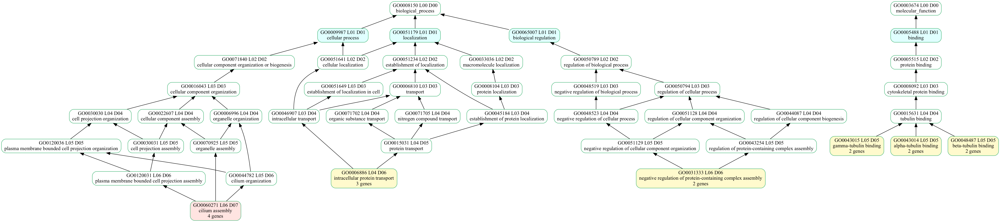

In [42]:
gi.show_go_dag_enrichment_results(go_results.obj)

In [43]:
gi.go_info(go_results.term_id)

**<span style="color:gray;">GO:0060271:</span>** **cilium assembly**  
 The assembly of a cilium, a specialized eukaryotic organelle that consists of a filiform extrusion of the cell surface. Each cilium is bounded by an extrusion of the cytoplasmic membrane, and contains a regular longitudinal array of microtubules, anchored basally in a centriole.    

 ----

**<span style="color:gray;">GO:0043015:</span>** **gamma-tubulin binding**  
 Binding to the microtubule constituent protein gamma-tubulin.    

 ----

**<span style="color:gray;">GO:0043014:</span>** **alpha-tubulin binding**  
 Binding to the microtubule constituent protein alpha-tubulin.    

 ----

**<span style="color:gray;">GO:0048487:</span>** **beta-tubulin binding**  
 Binding to the microtubule constituent protein beta-tubulin.    

 ----

**<span style="color:gray;">GO:0031333:</span>** **negative regulation of protein-containing complex assembly**  
 Any process that stops, prevents, or reduces the frequency, rate or extent of protein complex assembly.    

 ----

**<span style="color:gray;">GO:0006886:</span>** **intracellular protein transport**  
 The directed movement of proteins in a cell, including the movement of proteins between specific compartments or structures within a cell, such as organelles of a eukaryotic cell.    

 ----

In [44]:
signif_genes = list(set(x for y in go_results.study_genes for x in y))

In [45]:
gi.gene_info(signif_genes)

**Symbol:** **_DDX3X_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CAP-Rf, DBX, DDX14, DDX3, HLP2, MRX102, MRXSSB  
*DEAD-box helicase 3 X-linked*  
**Summary:** The protein encoded by this gene is a member of the large DEAD-box protein family, that is defined by the presence of the conserved Asp-Glu-Ala-Asp (DEAD) motif, and has ATP-dependent RNA helicase activity. This protein has been reported to display a high level of RNA-independent ATPase activity, and unlike most DEAD-box helicases, the ATPase activity is thought to be stimulated by both RNA and DNA. This protein has multiple conserved domains and is thought to play roles in both the nucleus and cytoplasm. Nuclear roles include transcriptional regulation, mRNP assembly, pre-mRNA splicing, and mRNA export. In the cytoplasm, this protein is thought to be involved in translation, cellular signaling, and viral replication. Misregulation of this gene has been implicated in tumorigenesis. This gene has a paralog located in the nonrecombining region of the Y chromosome. Pseudogenes sharing similarity to both this gene and the DDX3Y paralog are found on chromosome 4 and the X chromosome. Alternative splicing results in multiple transcript variants. [provided by RefSeq, Oct 2014].  
**Genomic position:** X:41333348-41364472 (hg38), X:41192651-41223725 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=DDX3X)  


 ----

**Symbol:** **_OCRL_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** DENT2, Dent-2, INPP5F, LOCR, NPHL2, OCRL-1, OCRL1  
*OCRL inositol polyphosphate-5-phosphatase*  
**Summary:** This gene encodes an inositol polyphosphate 5-phosphatase. This protein is involved in regulating membrane trafficking and is located in numerous subcellular locations including the trans-Golgi network, clathrin-coated vesicles and, endosomes and the plasma membrane. This protein may also play a role in primary cilium formation. Mutations in this gene cause oculocerebrorenal syndrome of Lowe and also Dent disease. Alternate splicing results in multiple transcript variants. [provided by RefSeq, Jan 2016].  
**Genomic position:** X:129539849-129592561 (hg38), X:128673826-128726538 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=OCRL)  


 ----

**Symbol:** **_SYTL5_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** slp5  
*synaptotagmin like 5*  
**Summary:** The protein encoded by this gene belongs to the synaptotagmin-like (Slp) protein family, which contains a unique homology domain at the N-terminus, referred to as the Slp homology domain (SHD). The SHD functions as a binding site for Rab27A, which plays a role in protein transport. Expression of this gene is restricted to placenta and liver, suggesting that it might be involved in Rab27A-dependent membrane trafficking in specific tissues. Alternatively spliced transcript variants encoding different isoforms have been found for this gene. [provided by RefSeq, Sep 2009].  
**Genomic position:** X:38006553-38128819 (hg38), X:37865835-37988072 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=SYTL5)  


 ----

**Symbol:** **_EMD_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** EDMD, LEMD5, STA  
*emerin*  
**Summary:** Emerin is a serine-rich nuclear membrane protein and a member of the nuclear lamina-associated protein family. It mediates membrane anchorage to the cytoskeleton. Dreifuss-Emery muscular dystrophy is an X-linked inherited degenerative myopathy resulting from mutation in the emerin gene. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:154379273-154381574 (hg38), HG1497_PATCH:153547665-153549991, X:153607557-153609883 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=EMD)  


 ----

**Symbol:** **_RPGR_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** COD1, CORDX1, CRD, PCDX, RP15, RP3, XLRP3, orf15  
*retinitis pigmentosa GTPase regulator*  
**Summary:** This gene encodes a protein with a series of six RCC1-like domains (RLDs), characteristic of the highly conserved guanine nucleotide exchange factors. The encoded protein is found in the Golgi body and interacts with RPGRIP1. This protein localizes to the outer segment of rod photoreceptors and is essential for their viability. Mutations in this gene have been associated with X-linked retinitis pigmentosa (XLRP). Multiple alternatively spliced transcript variants that encode different isoforms of this gene have been reported, but the full-length natures of only some have been determined. [provided by RefSeq, Dec 2008].  
**Genomic position:** X:38269163-38327544 (hg38), X:38128416-38186817 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=RPGR)  


 ----

**Symbol:** **_OFD1_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** 71-7A, CXorf5, JBTS10, RP23, SGBS2  
*OFD1 centriole and centriolar satellite protein*  
**Summary:** This gene is located on the X chromosome and encodes a centrosomal protein. A knockout mouse model has been used to study the effect of mutations in this gene. The mouse gene is also located on the X chromosome, however, unlike the human gene it is not subject to X inactivation. Mutations in this gene are associated with oral-facial-digital syndrome type I and Simpson-Golabi-Behmel syndrome type 2. Many pseudogenes have been identified; a single pseudogene is found on chromosome 5 while as many as fifteen have been found on the Y chromosome. [provided by RefSeq, Aug 2016].  
**Genomic position:** X:13734743-13777955 (hg38), X:13752832-13787480 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=OFD1)  


 ----

**Symbol:** **_HDAC6_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** CPBHM, HD6, JM21, PPP1R90  
*histone deacetylase 6*  
**Summary:** Histones play a critical role in transcriptional regulation, cell cycle progression, and developmental events. Histone acetylation/deacetylation alters chromosome structure and affects transcription factor access to DNA. The protein encoded by this gene belongs to class II of the histone deacetylase/acuc/apha family. It contains an internal duplication of two catalytic domains which appear to function independently of each other. This protein possesses histone deacetylase activity and represses transcription. [provided by RefSeq, Jul 2008].  
**Genomic position:** X:48801377-48824982 (hg38), HG1436_HG1432_PATCH:48660776-48684381, X:48659784-48683392 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=HDAC6)  


 ----

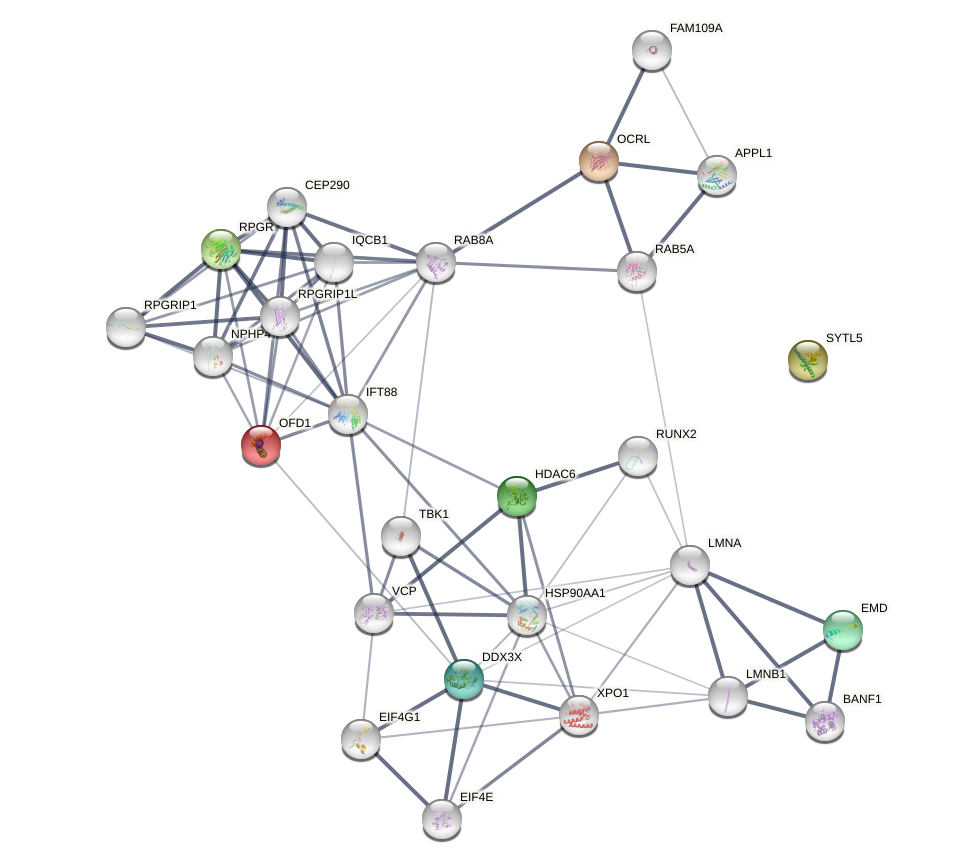

In [46]:
gi.show_string_network(signif_genes, nodes=20)

In [47]:
gi.gene_info('IFT88')

**Symbol:** **_IFT88_** (protein-coding) &nbsp; &nbsp; &nbsp; &nbsp; **Aliases:** D13S1056E, DAF19, TG737, TTC10, hTg737  
*intraflagellar transport 88*  
**Summary:** This gene encodes a member of the tetratrico peptide repeat (TPR) family. The encoded protein is involved in cilium biogenesis. Mutations of a similar gene in mouse can cause polycystic kidney disease. Several transcript variants encoding distinct isoforms have been identified for this gene. [provided by RefSeq, Jul 2017].  
**Genomic position:** 13:20567138-20691444 (hg38), 13:21140585-21265503 (hg19)  
[Gene card](https://www.genecards.org/cgi-bin/carddisp.pl?gene=IFT88)  


 ----